# **Explaining Portuguese exam results using CP and PDP profiles**

The goal of this homework was to explain the results of students from their lifestyles and life situations. Similarly to the previous homework, I use the Portuguese dataset only. For explanations I use cp and pdp from the dalex module. I found that in the dataset that I am using, most datapoints have similar CP profiles (modulo translation) for the majority of variables. From this follows, that PDP profiles don't differ much from CP profiles in terms of shape. There isn't much difference between PDP profiles for XGBoost and Random Forest Regressor - which are the two models that I am explaining.

# **Task 1**
$f(x_1, x_2)=(x_1 + x_2)^{2}$

Using basic property of expected value:
$g_{PD}^1(z)=\mathbb{E}_{x_2}[z^2 + 2zx_2 + x_2^2]=z^2 + 2z\mathbb{E}_{x_2}[x_2] + {E}_{x_2}[x_2^2]=z^2 + 2z*0 + \frac{1}{2}(\frac{1}{3}- (-\frac{1}{3})) = z^2 +\frac{1}{6}$


# **Task 2**

### **Subtask 2**
For majority of variables CP profiles are constant or nearly constant. The plots for them are included in the appendix. The plots, that I found most interesting are presented below:
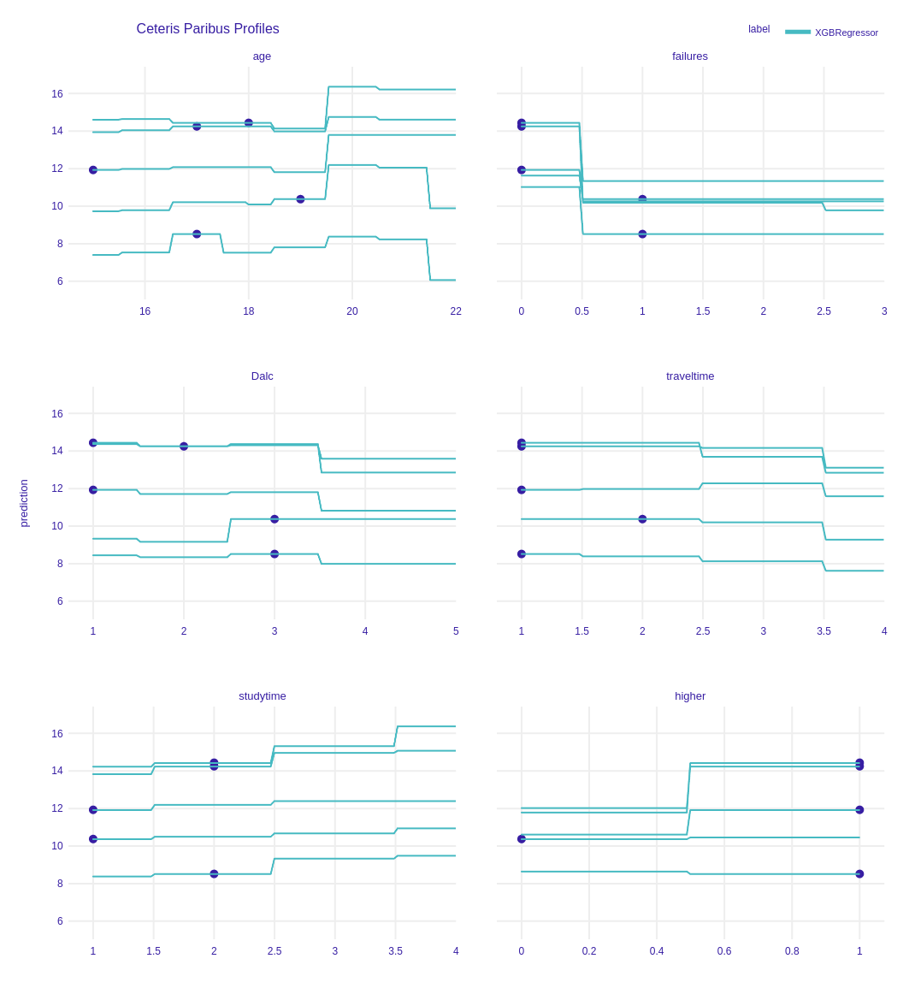

From those plots we can say, that those variables are most likely important in determining the student's score. We can suspect, that there are some monotonic dependencies between those variables and test results, but there are also those examples in which the result change is negligeble. To explain the meaning of those variable names - age is student's age, failures is the number of times the student failed the exam previously, studytime is how much a student studies (scale 1-5), higher is one when a student plans to pursue higher education, Dalc is how much alcohol does a student consume during the weekdays (scale 1-5) and traveltime is how much time does it take the student to get to the school (scale 1-5).

### **Subtask 3**
As we can observe in the subtask 2, for dalc, there is a student, for whom a decreased alcohol consumption in a week day would decrease their test results. I would guess, that this is either caused by the fact, that there aren't many students, who don't drink alcohol and have poor test results. It is also possible, that this is caused by some interesting correlations in the data.

### **Subtask 4**
In comparison to CP profiles, now more clear patterns can be observed. They all look as one would expect them to.
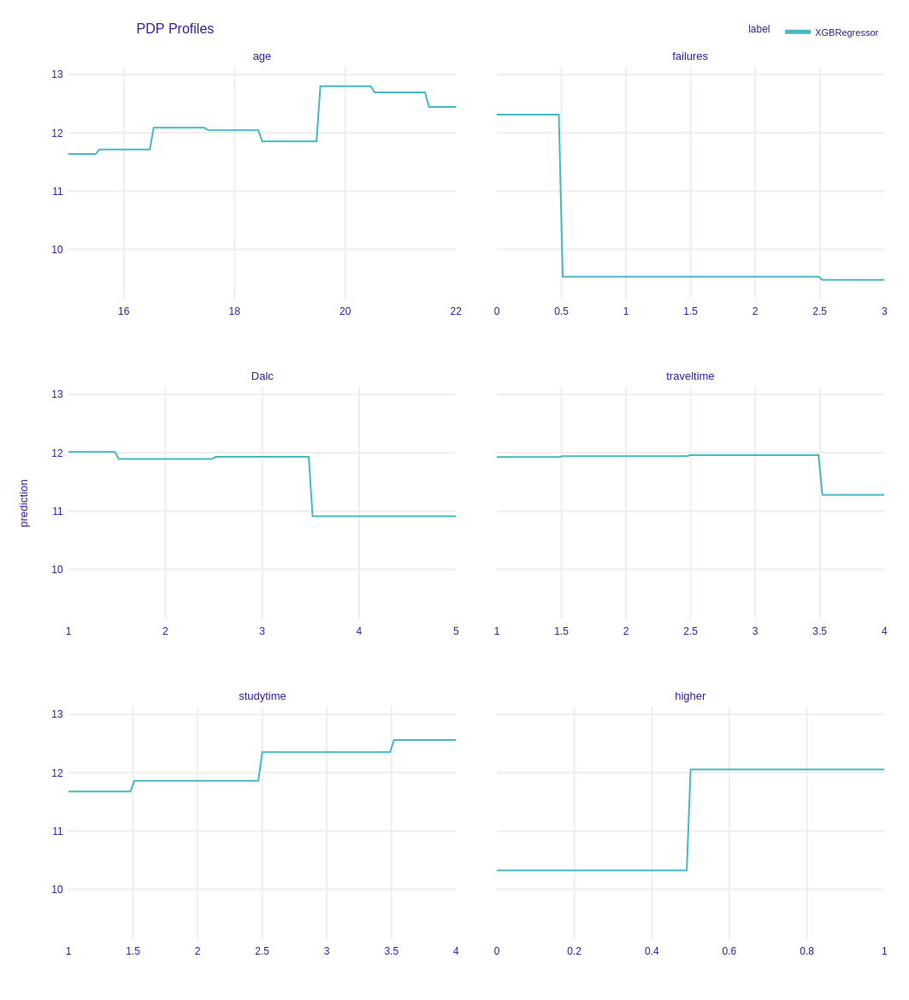

### **Subtask 5**
For most of the variables, the profiles for Random Forest Regressor and XGBRegressor are fairly similar. There are some exceptions - age seems to matter more in the case of XGBRegressor and failures in the case of Random forest regressor.
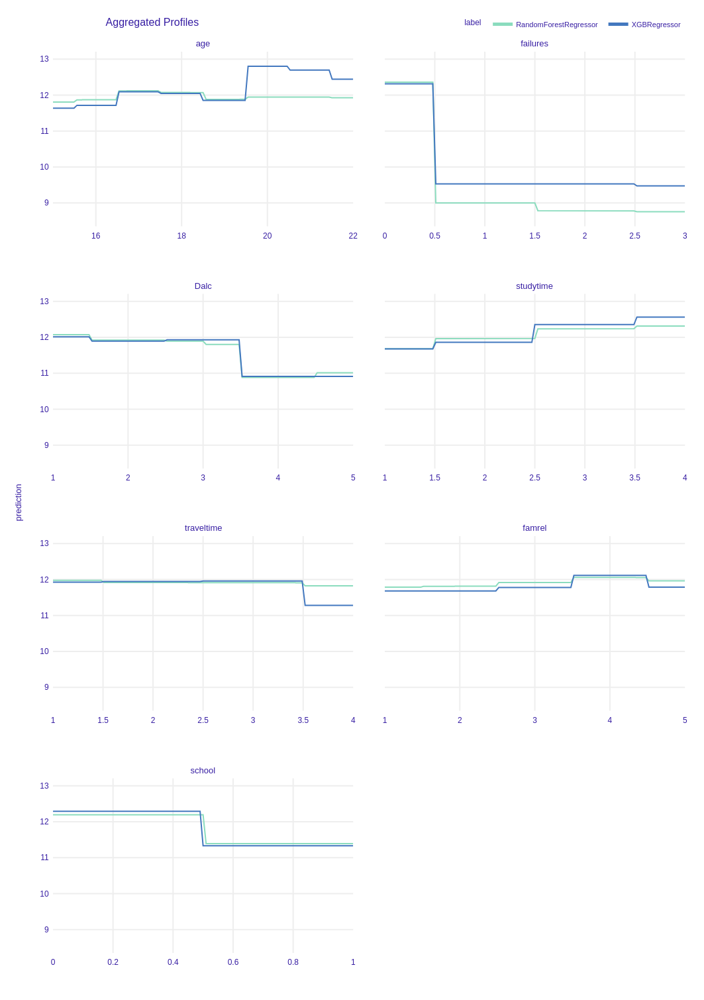

## **Appendix**
Contains the Python code used to create the above raport


# **Dataset**
This dataset contains the data about the scores of students of two different school in Portugal in math and Portuguese. The goal is to predict the final score of a student, using information about their lifestyle and background. I am going to focus only on predicting G3 - according to the description of the problem G1 and G2 are highly correlated with G3.  

### **Imports**
We need to install the necessary modules.

In [6]:
!pip install dalex

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


And now import everything that is necessary.

In [7]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import dalex as dx
import random

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error
from sklearn.feature_selection import RFECV

Set the seeds for reproducibility.

In [8]:
np.random.seed(10)
random.seed(10)

### **Data preparation**
We will start by reading the data.

In [9]:
portuguese_df = pd.read_csv('Portuguese.csv')

Split into features and targets. The same as in the previous homework, we focus on predicting the final result only.

In [10]:
port_x = portuguese_df.drop(['G3', 'G2', 'G1'], axis = 1)
port_y = portuguese_df[['G3']]

Categorical variables need to be encoded.

In [11]:
def encode_categorical(df):
    df = df.copy()
    
    df = df.replace({'GP': 0, 'MS': 1})
    df = df.replace({'F': 0, 'M': 1})
    df = df.replace({'U': 0, 'R': 1})
    df = df.replace({'LE3': 0, 'GT3': 1})
    df = df.replace({'A': 0, 'T': 1})
    df = df.replace({'no': 0, 'yes': 1})
    
    onehot_features = ['Mjob', 'Fjob', 'reason', 'guardian']
    df = pd.concat([df, pd.get_dummies(df[onehot_features])], axis=1)
    df = df.drop(onehot_features, axis=1)

    return df

In [12]:
port_x = encode_categorical(port_x)

There is little data available. There is much more data about results from portuguese than from math. For that reason, we are going to train our models using both datasets at once and then test them separately.

## **Homework implementation**
Below the code used for solving each of the required homework tasks is contained. Only XGBoost is used with the exception of the subtask 7.

### **Subtask 0**

We train two models XGBoost and random forest model. We train on the whole dataset, since there isn't much data and it shouldn't matter for the explanations.

In [13]:
models = {
    'Boosting': XGBRegressor(objective='reg:squarederror'),
    'Forest': RandomForestRegressor()
  }

for name, model in models.items():
    model.fit(port_x, port_y.values.ravel())

### **Subtask 1**
We sample a few random observations from the dataset and calculate the predictions.

In [14]:
n_samples = 5
samples = port_x.sample(n_samples)

models["Boosting"].predict(samples)

array([10.375422,  8.517876, 14.248777, 14.438366, 11.930245],
      dtype=float32)

### **Subtask 2**
Calculating what-if explanations of predictions using CP profiles.

In [15]:
explainer = dx.Explainer(models['Boosting'], port_x, port_y)
cp = explainer.predict_profile(new_observation=samples)

Preparation of a new explainer is initiated

  -> data              : 649 rows 43 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 649 values
  -> model_class       : xgboost.sklearn.XGBRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7fe412383e60> will be used (default)
  -> predict function  : Accepts only pandas.DataFrame, numpy.ndarray causes problems.
  -> predicted values  : min = 1.92, mean = 11.9, max = 16.6
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -8.78, mean = -0.00108, max = 5.47
  -> model_info        : package xgboost

A new explainer has been created!


Calculating ceteris paribus: 100%|██████████| 43/43 [00:00<00:00, 95.12it/s] 


In [16]:
cp.plot(variables=["Dalc", "Walc"])

In [17]:
cp.plot(variables=["failures"])

In [18]:
cp.plot(variables=['school', 'sex'])


In [19]:
 cp.plot(variables=['age', 'address'])


In [20]:
 cp.plot(variables=['famsize', 'Pstatus'])


In [21]:
 cp.plot(variables=['Medu', 'Fedu'])


In [22]:
 cp.plot(variables=['traveltime', 'studytime'])

In [23]:
 cp.plot(variables=['failures', 'schoolsup'])


In [24]:
 cp.plot(variables=['paid', 'famsup'])


In [25]:
 cp.plot(variables=['activities', 'nursery'])


In [26]:
 cp.plot(variables=['higher', 'internet'])


In [27]:
 cp.plot(variables=['romantic', 'famrel'])


In [28]:
 cp.plot(variables=['freetime', 'goout'])


In [29]:
 cp.plot(variables=['health', 'absences'])


### **Subtask 3**
Examples, where there are ones for which the prediction is  increasing and ones for which it is decreasing for the same variable.

In [30]:
 cp.plot(variables=['Dalc'])


### **Subtask 4**
Comparing pdp with cp results.

In [31]:
pdp = explainer.model_profile()


Calculating ceteris paribus: 100%|██████████| 43/43 [00:09<00:00,  4.58it/s]


In [42]:
pdp.plot(variables=["age", "failures", "Dalc", "traveltime", "studytime", "higher"], title="PDP Profiles")

In [41]:
cp.plot(variables=["age", "failures", "Dalc", "traveltime", "studytime", "higher"])

### **Subtask 5**
Comparison of pdp for two different models.

In [34]:
explainer_forest = dx.Explainer(models['Forest'], port_x, port_y)
pdp_forest = explainer_forest.model_profile()

/usr/local/lib/python3.7/dist-packages/sklearn/base.py:451: UserWarning:

X does not have valid feature names, but RandomForestRegressor was fitted with feature names



Preparation of a new explainer is initiated

  -> data              : 649 rows 43 cols
  -> target variable   : Parameter 'y' was a pandas.DataFrame. Converted to a numpy.ndarray.
  -> target variable   : 649 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7fe412383e60> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = 1.95, mean = 11.9, max = 17.5
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -5.47, mean = 0.00203, max = 3.51
  -> model_info        : package sklearn

A new explainer has been created!


Calculating ceteris paribus: 100%|██████████| 43/43 [00:08<00:00,  4.87it/s]


In [35]:
pdp_forest.plot(pdp, variables = ["age", "failures", "Dalc", "studytime", "traveltime", "famrel", "higher"])